# **COVID Dectection using CNN**

Reference

> https://www.kaggle.com/code/sana306/detection-of-covid-positive-cases-using-dl/notebook

> https://www.kaggle.com/code/deadskull7/covid-19-inf-lung-segmentation-classification

> https://github.com/mlmed/covid-severity

> https://github.com/ieee8023/covid-chestxray-dataset

> https://github.com/kanezaki/pytorch-unsupervised-segmentation

> https://www.ncbi.nlm.nih.gov/pmc/articles/PMC8192313/

> https://2020.midl.io/papers/chen20.html

# Datesets

> Dataset used: https://www.kaggle.com/datasets/tawsifurrahman/covid19-radiography-database

# ============================================================

# Summary of the method

The CNN was trained using RTX 2080 CUDA processor. The libraries that were used for Data processing: numpy, pandas, cv2, and albumentations, for data analysis: plotly, matplotlib, seaborn, for Data Modeling & Model Evaluation: sklearn, keras, tensorflow, for logging result: Wandb.

First, image was loaded from COVID-19_Radiography_Dataset with Normal and COVID case only. The lung opacity and viral pneumonia were not used. Each image was leveled with negative for Noraml and postive for COVID cases. Then I checked for any duplicate copies of the filed in the dataset. The total number of the image in the dataset was 13808. 3 Negative and 3 Positive cases were shown first to see any noticeable feature that could identify each case. However without any medical background the images looked same to me.

Then information on the image input was listed: 
    Image Shape: (299, 299, 3)
    Image Height: 299
    Image Width: 299
    Image Dimension: 3
    Image Size: 261kb
    Image Data Type: uint8
    Maximum RGB value of the image: 255
    Minimum RGB value of the image: 5

eventhough the image was in gray, image itself was in rgb or 3 channel.

Several image analysis was conducted
1. Ben Graham's method: which implments gaussian blur
2. Fast Fourier Transform
3. Erosion Method
4. Dilation Method
5. Canny edge detection

From the above analysis, the erosion method showed a good candidate to use for ROI. The clustering would be eaiser as the lung segment of the xray image are much more generalized. The erosion is typically used to erode away the boundaries of foreground object. 

A several image augmentation method are tested using albumentation package to see which augmentation will be helpful in expanding the dataset. Randombrightness, Randomcrop, Rotate, RGBshift, VerticalFlip, HorizontalFlip and RandomContrast was tested. A RGB shift, vertical flip and randomcrop were not used when augmentation was done.


**CNN Model**

Image was rescaled to (70,70,3) and normalized with value 255. Then each images was converted to numpy arrays. The dataset was split into train, test, and validation using train_test_split function. The layers of the cnn_model consisted of conv2d, maxpooling, dropout, flatten and dense. ***The image of layers are found below***
1. 2D Convolution Layer, this layer creates a convolution kernel that is wind with layers input which helps produce a tensor of outputs
2. MaxPooling2D layer reduces the size of the image representation our convolutional layers learnt, and in doing so it reduces the number of parameters and computations the network needs to perform.
3. Dropout layer turns off a percentage of neurons at every step
4. Flattens our array so we can feed the convolution layer outputs (a matrix) into our fully connected layer (an array)
5. Dense layer creates dense, fully connected layers with x inputs and y outputs - it simply outputs the dot product of our inputs and weights

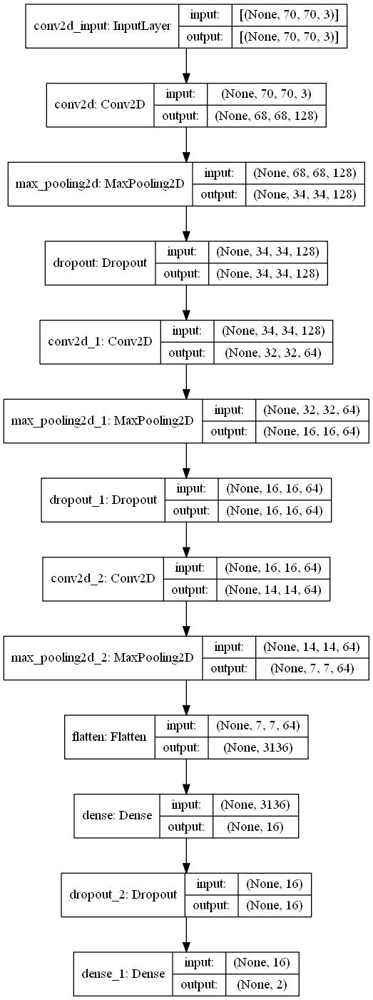

The Adam (Adaptive Moment Estimation) optimizer was used. Comparison between different optimizer is shown below.

Note: The results of the Adam optimizer are generally better than every other optimization algorithms, have faster computation time, and require fewer parameters for tuning. Because of all that, Adam is recommended as the default optimizer for most of the applications. 


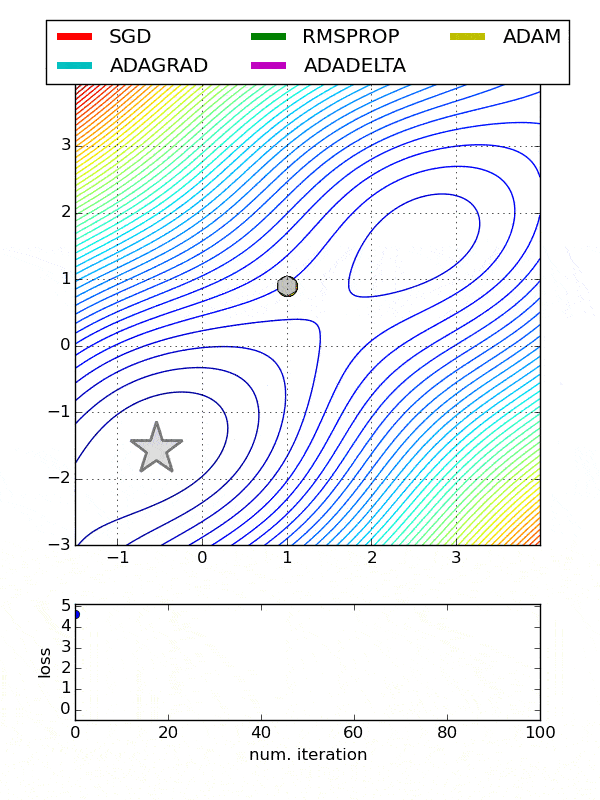

image source: https://towardsdatascience.com/optimizers-for-training-neural-network-59450d71caf6

The probabilistic loss function used was sparse categorical crossentrophy instead of categorical crossentrophy. As the dataset loaded was set to have levels in either 0 or 1. 

$J(\textbf{w}) = -\frac{1}{N} \sum_{i=1}^{N} \left[ y_i \text{log}(\hat{y}_i) + (1-y_i) \text{log}(1-\hat{y}_i) \right]$


If Yi's are one-hot encoded, use categorical_crossentropy. Examples for a 3-class classification: [1,0,0] , [0,1,0], [0,0,1]

If Yi's are integers, use sparse_categorical_crossentropy. Examples for 3-class classification: [1] , [2], [3]

A relu function was used for conv2d layer.

The result for classification on train, val, test data are shown below. ***Confusion matrix is also found below***

-----------------------------Convolution Neural Network-----------------------------

Classification Report for Train Data

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      7287
           1       0.98      0.99      0.98      2654

    accuracy                           0.99      9941
   macro avg       0.99      0.99      0.99      9941
weighted avg       0.99      0.99      0.99      9941

--------------------------------------------------------------------------
Recall on Train Data:  0.9894
Specificity on Train Data:  0.9911
Accuracy on Train Data:  0.9906
Precision on Train Data:  0.9758
F1 Score on Train Data:  0.9826
--------------------------------------------------------------------------

Classification Report for Validation Data

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       844
           1       0.93      0.93      0.93       261

    accuracy                           0.97      1105
   macro avg       0.95      0.95      0.95      1105
weighted avg       0.97      0.97      0.97      1105

--------------------------------------------------------------------------
Recall on Val Data:  0.931
Specificity on Val Data:  0.9775
Accuracy on Val Data:  0.9665
Precision on Val Data:  0.9275
F1 Score on Val Data:  0.9293
--------------------------------------------------------------------------

Classification Report for Test Data

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2061
           1       0.93      0.94      0.94       701

    accuracy                           0.97      2762
   macro avg       0.96      0.96      0.96      2762
weighted avg       0.97      0.97      0.97      2762

--------------------------------------------------------------------------
Recall on Test Data:  0.9444
Specificity on Test Data:  0.9772
Accuracy on Test Data:  0.9689
Precision on Test Data:  0.9337
F1 Score Test Data:  0.939
--------------------------------------------------------------------------

**Changes in data and parameters**

Several other options was tested to improve the performance.
The default setting was no augmentation in dataset, normalize image with 255, cnn batch size of 256

The alternative was
1. normalize by image.max()
2. batch = 64
3. erode implemented
4. dilation implemented
5. augmentation to increase the dataset size by 5
6. augmentation to increase the dataset size by 5, normalize by image.max()
7. augmentation to increase the dataset size by 2, normalize by image.max()

Plots on accuracy, loss, val_accuracy, val_loss can be found below link:
https://wandb.ai/techboiz/covid-project?workspace=user-techboiz

Overall the accuracy to classify positive and negatice was around 95%

# ============================================================

In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Data Reading 
import os
from glob import glob
from PIL import Image

# Data Processing 
import numpy as np
import pandas as pd
import cv2
import random
import albumentations as A

# Data Analysis
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

# Data Modeling & Model Evaluation
from sklearn.model_selection import train_test_split
from keras.preprocessing import image
from tensorflow.keras import layers, models
from tensorflow.keras.utils import plot_model
import tensorflow as tf
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, recall_score, accuracy_score, precision_score, f1_score

# Grad-CAM
import keras
import matplotlib.cm as cm

# W&B
import wandb
wandb.login()
wandb.init(project="covid-project")

print("import done")

# Show all the result in cell
# from IPython.core.interactiveshell import InteractiveShell
# InteractiveShell.ast_node_interactivity = "all"

wandb: Currently logged in as: techboiz (use `wandb login --relogin` to force relogin)


import done


**Check cuda capabilities on tensorflow (GPU)**

In [2]:
tf.test.is_gpu_available(
    cuda_only=False, min_cuda_compute_capability=None
)

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


True

In [3]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

**Load images**

In [4]:
levels = ['Normal', 'COVID']
path = os.getcwd() + "/input/COVID-19_Radiography_Dataset"
data_dir = os.path.join(path)

data = []
for id, level in enumerate(levels):
    print(level)

    for file in os.listdir(os.path.join(data_dir, level)):
        data.append(['{}/{}'.format(level, file), level])

data = pd.DataFrame(data, columns = ['image_file', 'corona_result'])

data['path'] = path + '/' + data['image_file']
data['corona_result'] = data['corona_result'].map({'Normal': 'Negative', 'COVID': 'Positive'})
samples = 13808

data.head()

Normal
COVID


,image_file,corona_result,path
0,Normal/Normal-1.png,Negative,C:\Users\mbgdw\ML_project/input/COVID-19_Radio...
1,Normal/Normal-10.png,Negative,C:\Users\mbgdw\ML_project/input/COVID-19_Radio...
2,Normal/Normal-100.png,Negative,C:\Users\mbgdw\ML_project/input/COVID-19_Radio...
3,Normal/Normal-1000.png,Negative,C:\Users\mbgdw\ML_project/input/COVID-19_Radio...
4,Normal/Normal-10000.png,Negative,C:\Users\mbgdw\ML_project/input/COVID-19_Radio...


In [5]:
print('Number of Duplicated Samples: %d'%(data.duplicated().sum()))
print('Number of Total Samples: %d'%(data.isnull().value_counts()))

Number of Duplicated Samples: 0
Number of Total Samples: 13808


In [6]:
df = pd.DataFrame()
df['corona_result'] = ['Positive', 'Negative']
df['Count'] = [len(data[data['corona_result'] == 'Positive']), len(data[data['corona_result'] == 'Negative'])]
df = df.sort_values(by = ['Count'], ascending = True)

fig = px.bar(df, x = 'corona_result', y = 'Count', 
             color = "corona_result", text_auto='', width = 600, 
             color_discrete_sequence = ["orange", "purple"],
             template = 'plotly_dark')

fig.update_xaxes(showgrid = False)
fig.update_yaxes(showgrid = False)
fig.update_traces(textfont_size = 12, textangle = 0, textposition = "outside", cliponaxis = False)

fig.show()

In [7]:
data['image'] = data['path'].map(lambda x: np.asarray(Image.open(x).resize((70,70))))

data.head()

,image_file,corona_result,path,image
0,Normal/Normal-1.png,Negative,C:\Users\mbgdw\ML_project/input/COVID-19_Radio...,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
1,Normal/Normal-10.png,Negative,C:\Users\mbgdw\ML_project/input/COVID-19_Radio...,"[[9, 9, 8, 8, 7, 6, 5, 4, 2, 1, 1, 1, 0, 1, 2,..."
2,Normal/Normal-100.png,Negative,C:\Users\mbgdw\ML_project/input/COVID-19_Radio...,"[[0, 0, 0, 0, 27, 66, 83, 106, 116, 118, 131, ..."
3,Normal/Normal-1000.png,Negative,C:\Users\mbgdw\ML_project/input/COVID-19_Radio...,"[[0, 7, 26, 58, 67, 71, 69, 80, 102, 98, 108, ..."
4,Normal/Normal-10000.png,Negative,C:\Users\mbgdw\ML_project/input/COVID-19_Radio...,"[[132, 112, 100, 95, 91, 88, 86, 84, 83, 84, 8..."


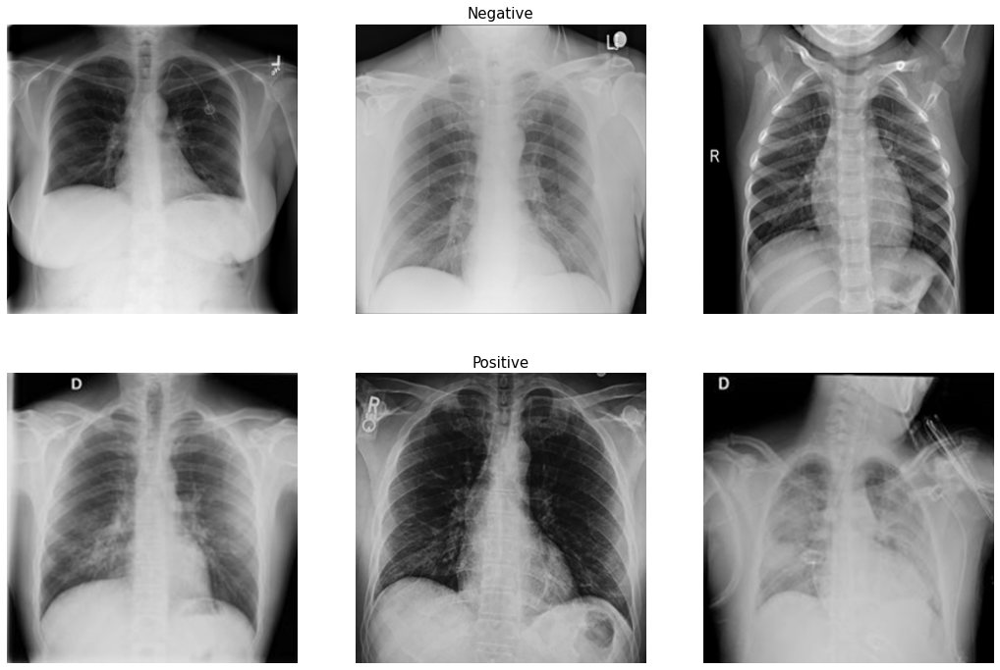

In [8]:
n_samples = 3

fig, m_axs = plt.subplots(2, n_samples, figsize = (6*n_samples, 3*4))

for n_axs, (type_name, type_rows) in zip(m_axs, data.sort_values(['corona_result']).groupby('corona_result')):
    n_axs[1].set_title(type_name, fontsize = 15)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state = 1234).iterrows()):       
        picture = c_row['path']
        image = cv2.imread(picture)
        c_ax.imshow(image)
        c_ax.axis('off')

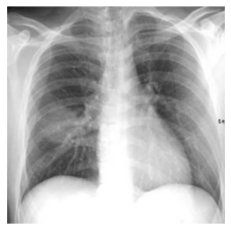

In [9]:
plt.figure()
image = cv2.imread(path + "/COVID/COVID-1002.png")
plt.imshow(image)
plt.axis('off')
plt.show() 

In [12]:
grayimage = cv2.imread(path + "/COVID/COVID-1002.png", cv2.IMREAD_GRAYSCALE)

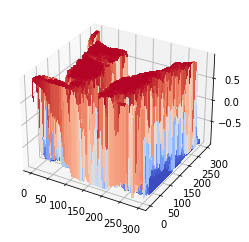

In [99]:
from matplotlib.ticker import LinearLocator

fig, ax = plt.subplots(subplot_kw={"projection": "3d"})


X = np.arange(0, 299, 1)
Y = np.arange(0, 299, 1)

X, Y = np.meshgrid(X, Y)

Z = np.asarray(grayimage)

z = Z / np.max(Z) * 15
a = -z + np.mean(z)
    
c = (2/(1 + np.exp(-2*a))) -1

surf = ax.plot_surface(X, Y, c, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

plt.show()



In [47]:
all_covid = []
all_normal = []

all_normal.extend(glob(os.path.join(path, "Normal/*.png")))
all_covid.extend(glob(os.path.join(path, "COVID/*.png")))

random.shuffle(all_normal)
random.shuffle(all_covid)

images = all_normal[:50] + all_covid[:50] 

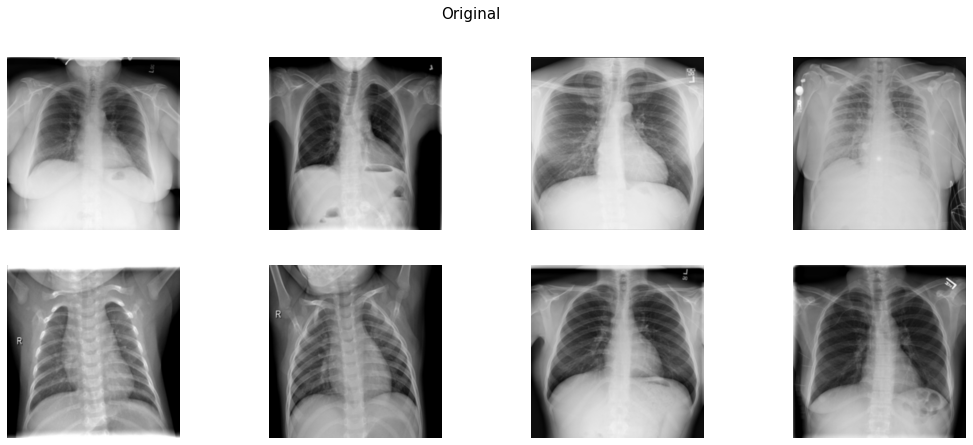

In [75]:
fig = plt.figure(figsize = (18, 7))
fig.suptitle("Original", fontsize = 15)
columns = 4; rows = 2

for i in range(1, columns*rows +1):
    img = cv2.imread(images[i])
    img = cv2.resize(img, (512, 512))
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    plt.axis(False)

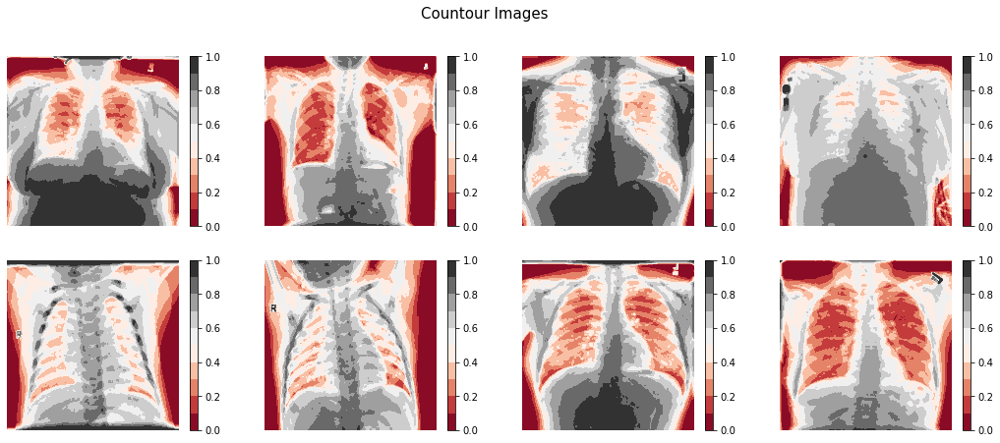

In [76]:
X = np.arange(0, 512, 1)
Y = np.arange(0, 512, 1)

fig = plt.figure(figsize = (18, 7))
fig.suptitle("Countour Images", fontsize = 15)
columns = 4; rows = 2

for i in range(1, columns*rows +1):
    
    img = cv2.imread(images[i], cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (512, 512))
    Z = np.asarray(img)
    
    z = Z / np.max(Z)
    
    
    fig.add_subplot(rows, columns, i)
    plt.contourf(X,Y,z, 10, cmap='RdGy')
    plt.colorbar();
    plt.gca().invert_yaxis()
    
    plt.axis(False)

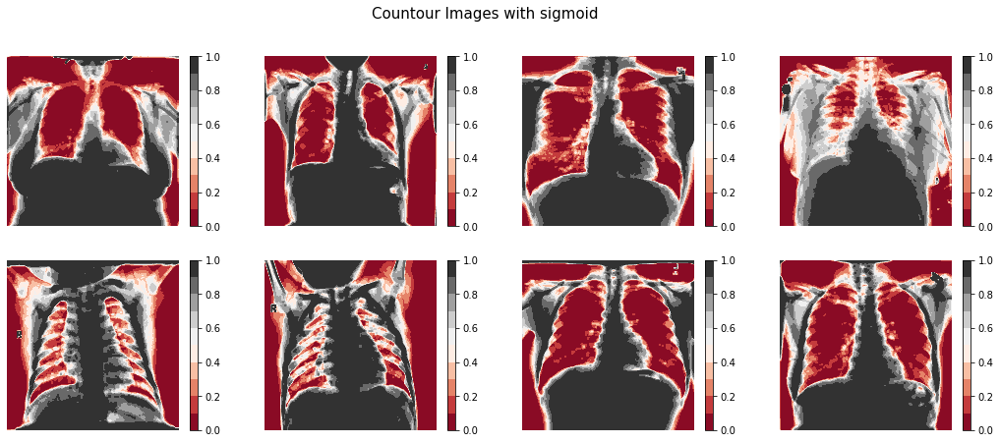

In [95]:
X = np.arange(0, 512, 1)
Y = np.arange(0, 512, 1)

fig = plt.figure(figsize = (18, 7))
fig.suptitle("Countour Images with sigmoid", fontsize = 15)
columns = 4; rows = 2

for i in range(1, columns*rows +1):
    
    img = cv2.imread(images[i], cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (512, 512))
    Z = np.asarray(img)
    
    z = Z / np.max(Z) * 15
    a = z - np.mean(z)
    
    c = 1/(1 + np.exp(-a))
    
    fig.add_subplot(rows, columns, i)
#     plt.contourf(X,Y,z, 10, cmap='RdGy')
    plt.contourf(X,Y,c, 10, cmap='RdGy')
    plt.colorbar();
    plt.gca().invert_yaxis()
    
    plt.axis(False)

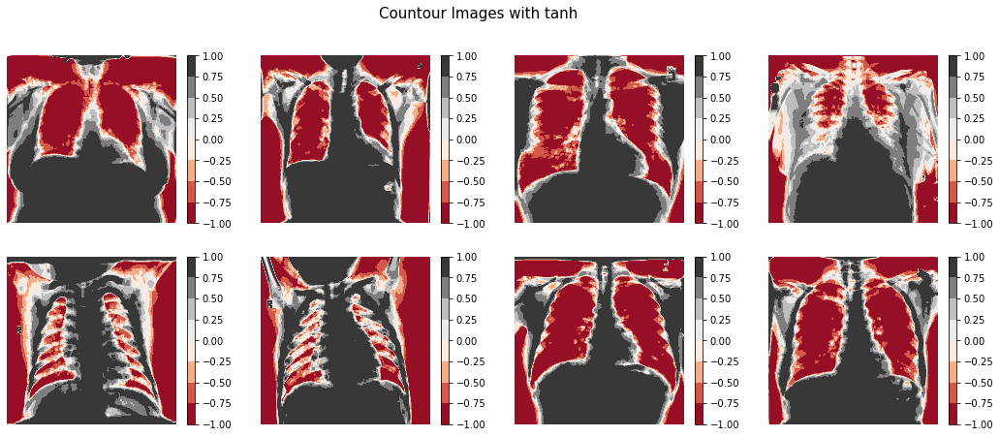

In [102]:
X = np.arange(0, 512, 1)
Y = np.arange(0, 512, 1)

fig = plt.figure(figsize = (18, 7))
fig.suptitle("Countour Images with tanh", fontsize = 15)
columns = 4; rows = 2

for i in range(1, columns*rows +1):
    
    img = cv2.imread(images[i], cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (512, 512))
    Z = np.asarray(img)
    
    z = Z / np.max(Z) * 8
    a = z - np.mean(z)

    c = (2/(1 + np.exp(-2*a))) -1
    
    fig.add_subplot(rows, columns, i)
#     plt.contourf(X,Y,z, 10, cmap='RdGy')
    plt.contourf(X,Y,c, cmap='RdGy')
    plt.colorbar();
    plt.gca().invert_yaxis()
    
    plt.axis(False)

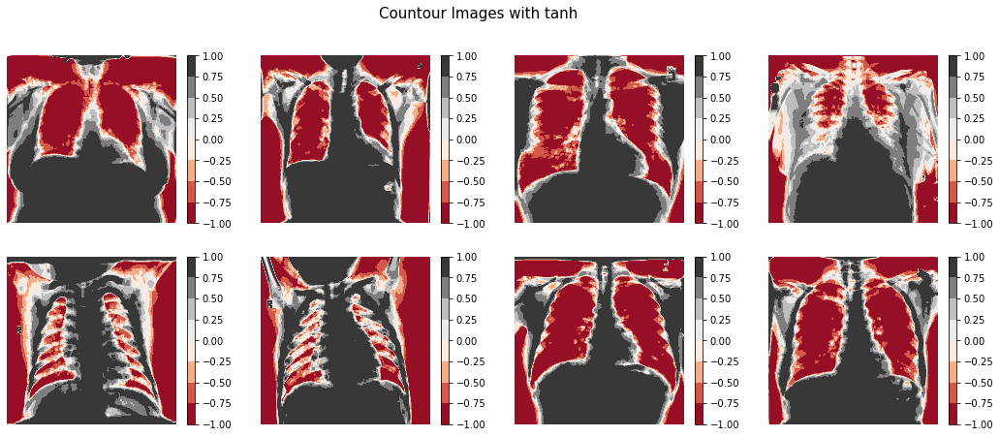

In [108]:
X = np.arange(0, 512, 1)
Y = np.arange(0, 512, 1)

fig = plt.figure(figsize = (18, 7))
fig.suptitle("Countour Images with tanh", fontsize = 15)
columns = 4; rows = 2

for i in range(1, columns*rows +1):
    
    img = cv2.imread(images[i], cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (512, 512))
    
   
    Z = np.asarray(img)
    
    z = Z / np.max(Z) * 8
    a = z - np.mean(z)

    c = (2/(1 + np.exp(-2*a))) -1
    
    fig.add_subplot(rows, columns, i)
#     plt.contourf(X,Y,z, 10, cmap='RdGy')
    plt.contourf(X,Y,c, cmap='RdGy')
    plt.colorbar();
    plt.gca().invert_yaxis()
    
    plt.axis(False)

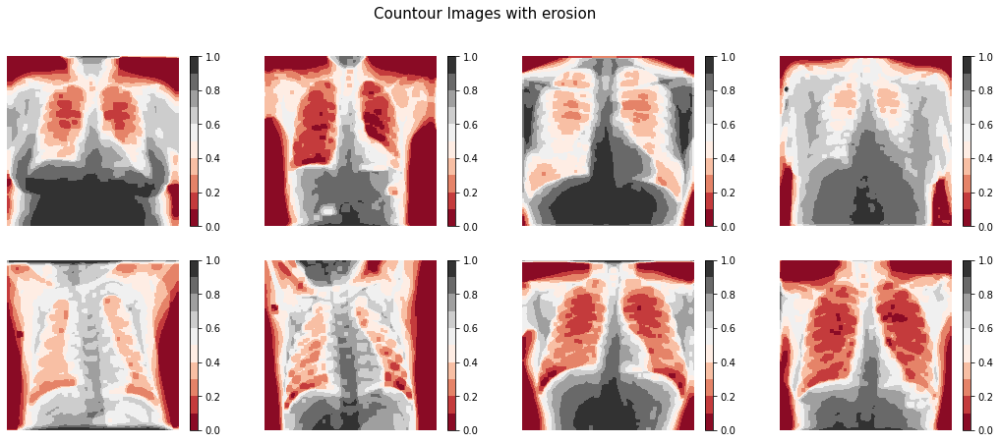

In [77]:
X = np.arange(0, 512, 1)
Y = np.arange(0, 512, 1)

fig = plt.figure(figsize = (18, 7))
fig.suptitle("Countour Images with erosion", fontsize = 15)
columns = 4; rows = 2

for i in range(1, columns*rows +1):
    
    img = cv2.imread(images[i], cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (512, 512))
    kernel = np.ones((5, 5), np.uint8)
    img_erosion = cv2.erode(img, kernel, iterations=3)
    
    Z = np.asarray(img_erosion)
    
    z = Z / np.max(Z)
    
    
    fig.add_subplot(rows, columns, i)
    plt.contourf(X,Y,z, 10, cmap='RdGy')
    plt.colorbar();
    plt.gca().invert_yaxis()
    
    plt.axis(False)

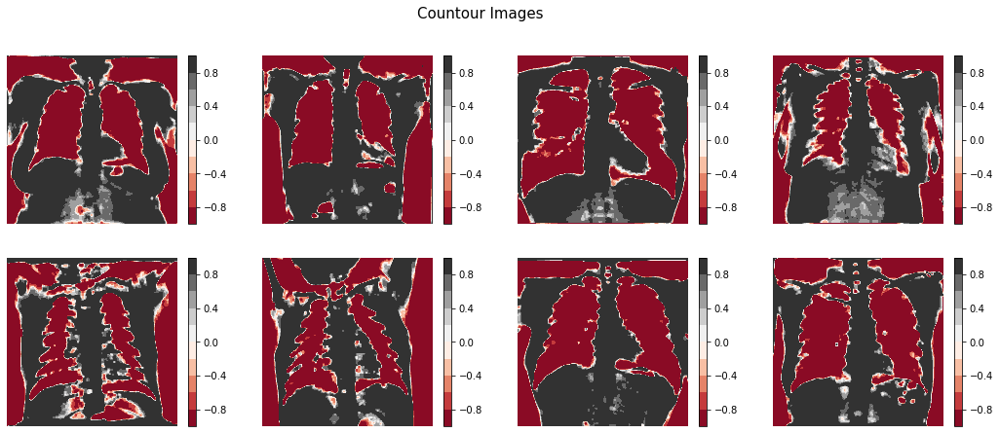

In [111]:
X = np.arange(0, 512, 1)
Y = np.arange(0, 512, 1)

fig = plt.figure(figsize = (18, 7))
fig.suptitle("Countour Images", fontsize = 15)
columns = 4; rows = 2

for i in range(1, columns*rows +1):
    
    img = cv2.imread(images[i])
    img = cv2.resize(img, (512, 512))
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    img = cv2.addWeighted (img, 4, cv2.GaussianBlur(img, (0,0), 512/10), -4, 128)
    
    rgbimg = cv2.cvtColor(img, cv2.COLOR_HSV2RGB)
    
    
    gray = cv2.cvtColor(rgbimg, cv2.COLOR_RGB2GRAY)

    
    
    kernel = np.ones((3, 3), np.uint8)
    img_erosion = cv2.erode(gray, kernel, iterations=3)

#     Z = np.asarray(gray)
    
    Z = np.asarray(img_erosion)
    
    z = Z / np.max(Z) * 10
    a = z - np.mean(z)
    c = (2/(1 + np.exp(-2*a))) -1

#     z = Z / np.max(Z)
        
    fig.add_subplot(rows, columns, i)
    plt.contourf(X,Y,c, 10, cmap='RdGy')
    plt.colorbar();
    plt.gca().invert_yaxis()
    
    plt.axis(False)

In [21]:
print('Image Shape: {}'.format(image.shape))
print('Image Height: {}'.format(image.shape[0]))
print('Image Width: {}'.format(image.shape[1]))
print('Image Dimension: {}'.format(image.ndim))
print('Image Size: {}kb'.format(image.size//1024))
print('Image Data Type: {}'.format(image.dtype))
print('Maximum RGB value of the image: {}'.format(image.max()))
print('Minimum RGB value of the image: {}'.format(image.min()))

Image Shape: (299, 299)
Image Height: 299
Image Width: 299
Image Dimension: 2
Image Size: 87kb
Image Data Type: uint8
Maximum RGB value of the image: 255
Minimum RGB value of the image: 5


In [112]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

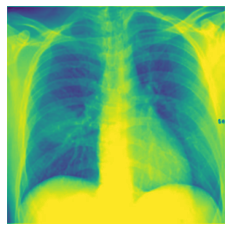

In [116]:
plt.figure()
image = cv2.imread(path + "/COVID/COVID-1002.png", cv2.IMREAD_GRAYSCALE )
plt.imshow(image)
plt.axis('off')
plt.show() 

In [132]:
a = np.asarray(image) / 255
a.flatten()

array([0.65490196, 0.56470588, 0.56078431, ..., 0.8745098 , 0.87058824,
       0.8745098 ])

In [133]:
pca = PCA(2)
converted_data = pca.fit_transform(a)

In [134]:
converted_data.shape

(299, 2)

C:\Users\mbgdw\AppData\Local\Temp\ipykernel_1532\1405474041.py:6: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



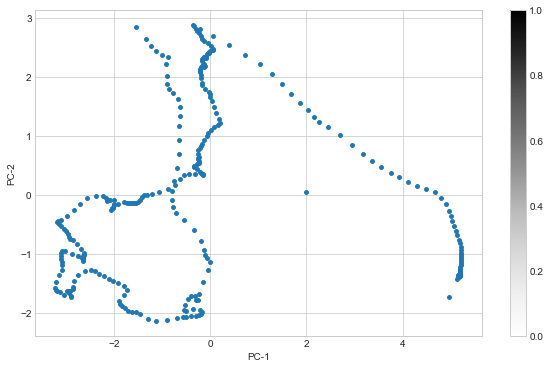

In [135]:
plt.style.use('seaborn-whitegrid')
plt.figure(figsize = (10,6))
c_map = plt.cm.get_cmap('jet', 10)
plt.scatter(converted_data[:, 0], converted_data[:, 1], s = 15,
            cmap = c_map)
plt.colorbar()
plt.xlabel('PC-1') , plt.ylabel('PC-2')
plt.show()

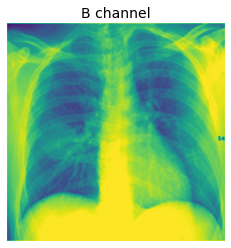

In [11]:
plt.title('B channel', fontsize = 14)
plt.imshow(image[ : , : , 0])
plt.axis('off');
plt.show()

**Ben graham's method**

In [12]:
all_covid = []
all_normal = []

all_normal.extend(glob(os.path.join(path, "Normal/*.png")))
all_covid.extend(glob(os.path.join(path, "COVID/*.png")))

random.shuffle(all_normal)
random.shuffle(all_covid)

images = all_normal[:50] + all_covid[:50] 

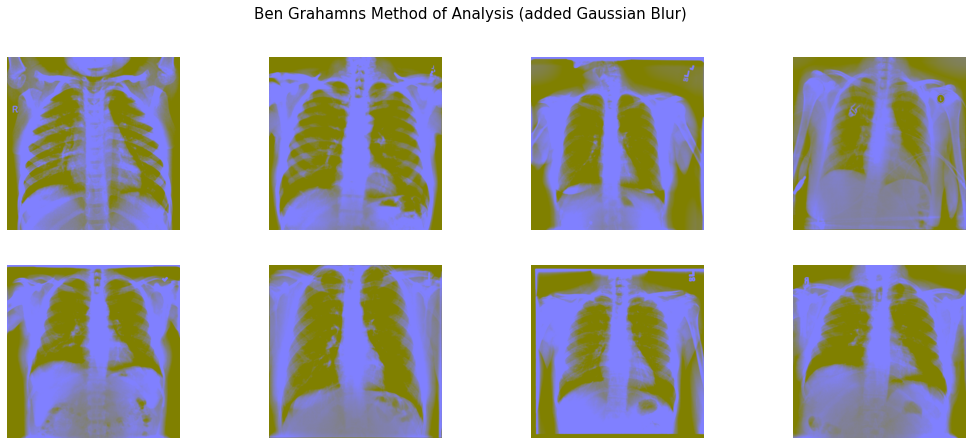

In [13]:
fig = plt.figure(figsize = (18, 7))
fig.suptitle("Ben Grahamns Method of Analysis (added Gaussian Blur)", fontsize = 15)
columns = 4; rows = 2

for i in range(1, columns*rows +1):
    img = cv2.imread(images[i])
    img = cv2.resize(img, (512, 512))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    img = cv2.addWeighted (img, 4, cv2.GaussianBlur(img, (0,0), 512/10), -4, 128)
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    plt.axis(False)

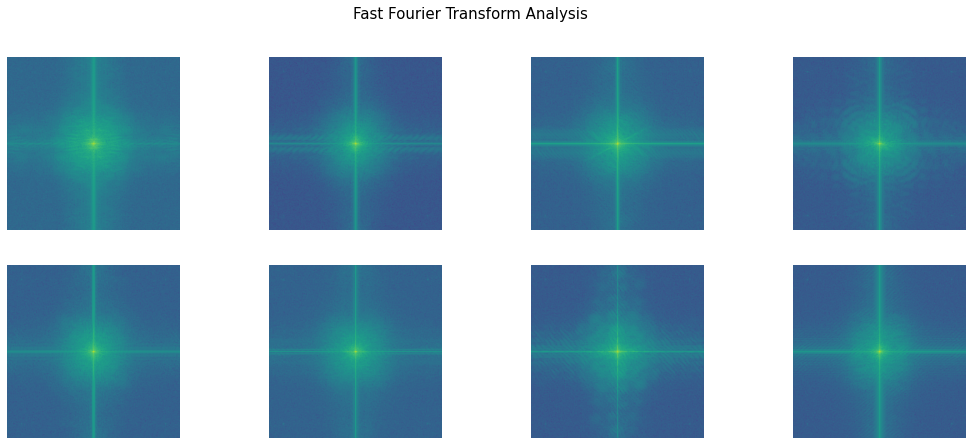

In [14]:
fig=plt.figure(figsize=(18, 7))
fig.suptitle("Fast Fourier Transform Analysis", fontsize = 15)
columns = 4; rows = 2
for i in range(1, columns*rows +1):
    img = cv2.imread(images[i])
    img = cv2.resize(img, (512, 512))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20*np.log(np.abs(fshift))
    fig.add_subplot(rows, columns, i)
    plt.imshow(magnitude_spectrum)
    plt.axis(False)

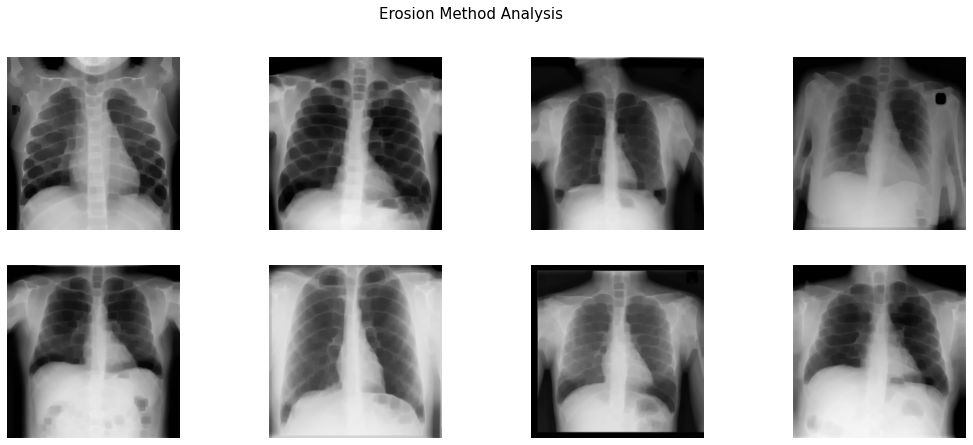

In [15]:
fig=plt.figure(figsize=(18, 7))
fig.suptitle("Erosion Method Analysis", fontsize = 15)
columns = 4; rows = 2
for i in range(1, columns*rows +1):
    img = cv2.imread(images[i])
    img = cv2.resize(img, (512, 512))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    kernel = np.ones((5, 5), np.uint8)
    img_erosion = cv2.erode(img, kernel, iterations=3)
    fig.add_subplot(rows, columns, i)
    plt.imshow(img_erosion)
    plt.axis(False)

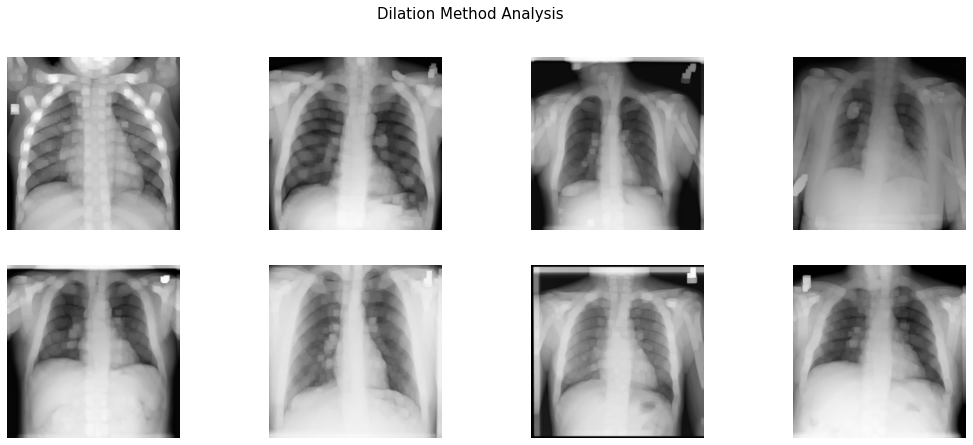

In [16]:
fig=plt.figure(figsize=(18, 7))
fig.suptitle("Dilation Method Analysis", fontsize = 15)
columns = 4; rows = 2
for i in range(1, columns*rows +1):
    img = cv2.imread(images[i])
    img = cv2.resize(img, (512, 512))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    kernel = np.ones((5, 5), np.uint8)
    img_erosion = cv2.dilate(img, kernel, iterations=3)
    fig.add_subplot(rows, columns, i)
    plt.imshow(img_erosion)
    plt.axis(False)

https://www.geeksforgeeks.org/erosion-dilation-images-using-opencv-python/

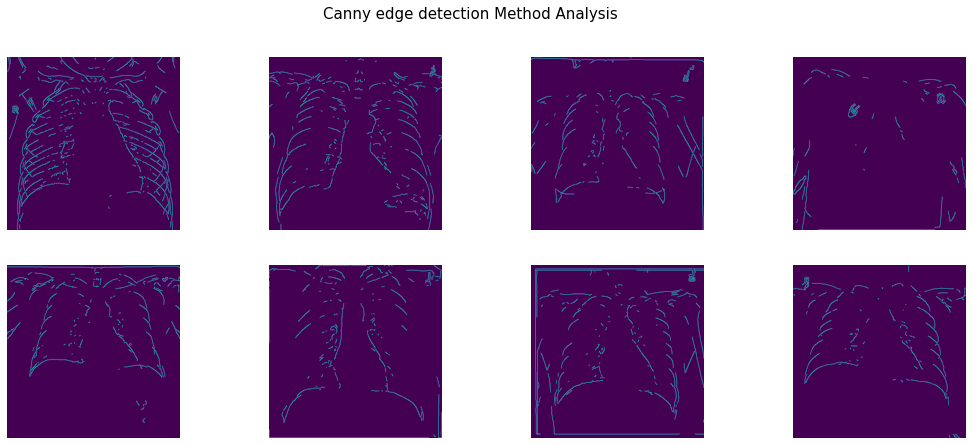

In [17]:
fig=plt.figure(figsize=(18, 7))
fig.suptitle("Canny edge detection Method Analysis", fontsize = 15)
columns = 4; rows = 2
for i in range(1, columns*rows +1):
    img = cv2.imread(images[i])
    img = cv2.resize(img, (512, 512))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(img, 80, 100)
    fig.add_subplot(rows, columns, i)
    plt.imshow(edges)
    plt.axis(False)

In [18]:
def plot_multiple_img(img_matrix_list, title_list, ncols, main_title = ""):
    
    fig, myaxes = plt.subplots(figsize = (15, 8), nrows = 2, ncols = ncols, squeeze = False)
    fig.suptitle(main_title, fontsize = 18)
    fig.subplots_adjust(wspace = 0.3)
    fig.subplots_adjust(hspace = 0.3)
    
    for i, (img, title) in enumerate(zip(img_matrix_list, title_list)):
        myaxes[i // ncols][i % ncols].imshow(img)
        myaxes[i // ncols][i % ncols].set_title(title, fontsize = 15)
        
    plt.show()

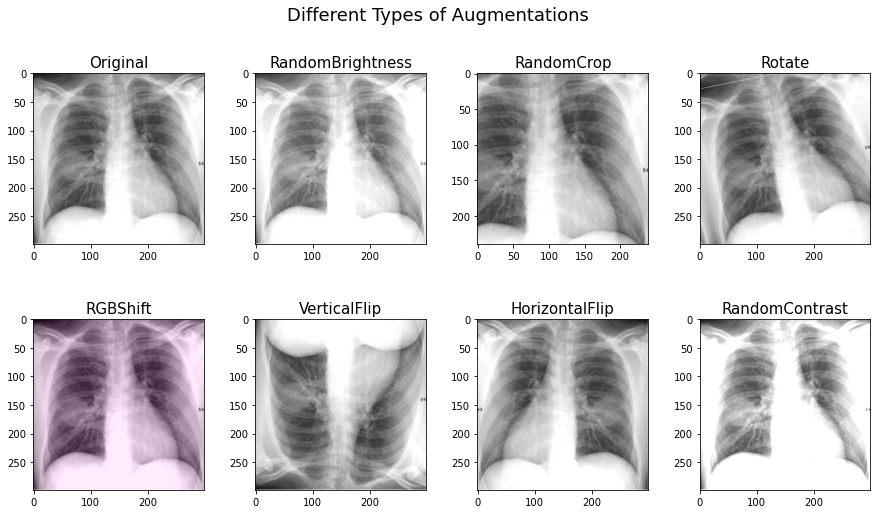

In [19]:
chosen_image = cv2.imread(path + "/COVID/COVID-1002.png")

albumentation_list = [A.RandomBrightness(p = 1), A.RandomCrop(p = 1,height = 240, width = 240), A.Rotate(p = 1, limit = 15),
                      A.RGBShift(p = 1), A.VerticalFlip(p = 1), A.HorizontalFlip(p=1) ,  A.RandomContrast(limit = 0.5, p = 1)]

img_matrix_list = []
bboxes_list = []
for aug_type in albumentation_list:
    img = aug_type(image = chosen_image)['image']
    img_matrix_list.append(img)

img_matrix_list.insert(0,chosen_image)    

titles_list = ["Original", "RandomBrightness", "RandomCrop", "Rotate", "RGBShift", "VerticalFlip","HorizontalFlip", "RandomContrast"]

plot_multiple_img(img_matrix_list, titles_list, ncols = 4, main_title = "Different Types of Augmentations")

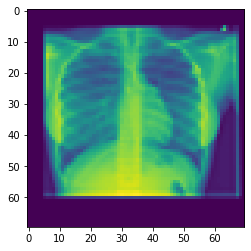

In [20]:
imgplot = plt.imshow(data['image'][0])

In [25]:
transform = A.Compose([A.RandomBrightness(p = 0.5), A.Rotate(p = 0.5, limit = 15),
                       A.HorizontalFlip(p=0.5) ,  A.RandomContrast(limit = 0.5, p = 0.5)])


In [26]:
# all_data = []

# # Storing images and their labels into a list for further Train Test split

# for i in range(len(data)):
#     image = cv2.imread(data['path'][i])
#     image = cv2.resize(image, (70, 70))
# #     image = cv2.resize(image, (70, 70)) / image.max()
# #     image = cv2.resize(image, (70, 70)) / 255
# #     image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) /255
# #     image = image[:,:,np.newaxis]
#     label = 1 if data['corona_result'][i] == "Positive" else 0
    
# #     all_data.append([image, label])

#     for j in range(5):
#         augmentation = transform(image=image)
#         # normalization
#         augmented_im = augmentation["image"]
#         augmented_im = augmented_im / 255
#         all_data.append([augmented_im, label])

In [27]:
# all_data = []

# # Storing images and their labels into a list for further Train Test split

# for i in range(len(data)):
#     image = cv2.imread(data['path'][i])
#     image = cv2.resize(image, (70, 70))
# #      image = cv2.resize(image, (70, 70)) / 255
#     label = 1 if data['corona_result'][i] == "Positive" else 0
#     kernel = np.ones((5, 5), np.uint8)
#     img_erosion = cv2.dilate(image, kernel, iterations=3) / 255
    
# #     all_data.append([image, label])
#     all_data.append([img_erosion, label])

In [28]:
all_data = []

# Storing images and their labels into a list for further Train Test split

for i in range(len(data)):
    image = cv2.imread(data['path'][i])
    image = cv2.resize(image, (70, 70)) / 255.0
    label = 1 if data['corona_result'][i] == "Positive" else 0
    all_data.append([image, label])

In [29]:
all_data[0][0].shape

(70, 70, 3)

In [30]:
x = []
y = []

for image, label in all_data:  
    x.append(image)
    y.append(label)

# Converting to Numpy Array    
x = np.array(x)
y = np.array(y)




In [31]:
len(all_data)

13808

In [32]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 42)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size = 0.1, random_state = 42)

print(x_train.shape, x_test.shape, x_val.shape, y_train.shape, y_test.shape, y_val.shape)

(9941, 70, 70, 3) (2762, 70, 70, 3) (1105, 70, 70, 3) (9941,) (2762,) (1105,)


# CNN Model

1. MaxPooling2D layer reduces the size of the image representation our convolutional layers learnt, and in doing so it reduces the number of parameters and computations the network needs to perform.

2. Dropout layer turns off a percentage of neurons at every step

3. Flattens our array so we can feed the convolution layer outputs (a matrix) into our fully connected layer (an array)

4. Dense layer creates dense, fully connected layers with x inputs and y outputs - it simply outputs the dot product of our inputs and weights

In [33]:
cnn_model = models.Sequential()
cnn_model.add(layers.Conv2D(filters = 128, kernel_size = (3, 3), activation = 'relu', input_shape = (70, 70, 3)))
# cnn_model.add(layers.Conv2D(filters = 128, kernel_size = (3, 3), activation = 'relu', input_shape = (70, 70, 1)))
cnn_model.add(layers.MaxPooling2D((2, 2)))
cnn_model.add(layers.Dropout(0.3))

cnn_model.add(layers.Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))
cnn_model.add(layers.Dropout(0.5))

cnn_model.add(layers.Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))
cnn_model.add(layers.Flatten())
cnn_model.add(layers.Dense(units = 16, activation = 'relu'))
cnn_model.add(layers.Dropout(0.2))

cnn_model.add(layers.Dense(units = 2))

cnn_model.compile(optimizer = 'adam', 
           loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True), 
           metrics = ['accuracy'])

cnn_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 68, 68, 128)       3584      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 34, 34, 128)       0         
_________________________________________________________________
dropout (Dropout)            (None, 34, 34, 128)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 32, 32, 64)        73792     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 14, 14, 64)        3

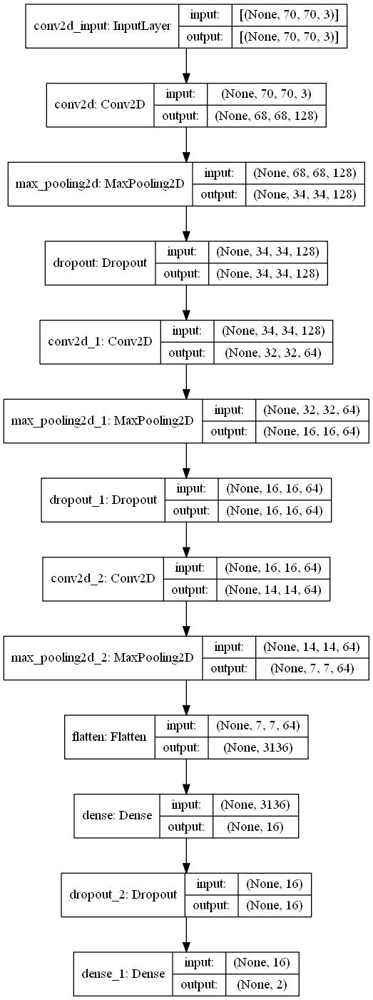

In [34]:
plot_model(cnn_model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [35]:
# es = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', mode = 'min', verbose = 1, patience = 4)

#tf.random.set_seed(42)
history = cnn_model.fit(x_train, y_train, 
                        epochs = 50, batch_size = 256,  
                        validation_data = (x_val, y_val), 
                        callbacks=[wandb.keras.WandbCallback()])

Epoch 1/50
39/39 [==============================] - 13s 110ms/step - loss: 0.5559 - accuracy: 0.7305 - val_loss: 0.5029 - val_accuracy: 0.8127
Epoch 2/50
39/39 [==============================] - 3s 66ms/step - loss: 0.4711 - accuracy: 0.7724 - val_loss: 0.4219 - val_accuracy: 0.8344
Epoch 3/50
39/39 [==============================] - 3s 67ms/step - loss: 0.4091 - accuracy: 0.8018 - val_loss: 0.3382 - val_accuracy: 0.8588
Epoch 4/50
39/39 [==============================] - 3s 69ms/step - loss: 0.3545 - accuracy: 0.8329 - val_loss: 0.3006 - val_accuracy: 0.8742
Epoch 5/50
39/39 [==============================] - 3s 67ms/step - loss: 0.3171 - accuracy: 0.8594 - val_loss: 0.2726 - val_accuracy: 0.8851
Epoch 6/50
39/39 [==============================] - 3s 70ms/step - loss: 0.2936 - accuracy: 0.8731 - val_loss: 0.2574 - val_accuracy: 0.8905
Epoch 7/50
39/39 [==============================] - 3s 74ms/step - loss: 0.2745 - accuracy: 0.8808 - val_loss: 0.2434 - val_accuracy: 0.8923
Epoch 8/50


In [36]:
yp_train = cnn_model.predict(x_train)
yp_train = np.argmax(yp_train, axis = 1)


In [37]:
yp_val = cnn_model.predict(x_val)
yp_val = np.argmax(yp_val, axis = 1)


In [38]:
yp_test = cnn_model.predict(x_test)
yp_test = np.argmax(yp_test, axis = 1)

In [39]:
def evaluation_parametrics(name, y_train, yp_train, y_val, yp_val, y_test, yp_test):
    
    print("\n-----------------------------{}-----------------------------\n".format(name))
    
    cm_train = confusion_matrix(y_train, yp_train)
    t1 = ConfusionMatrixDisplay(cm_train)
    s1 = round((cm_train[0,0]/(cm_train[0,0] + cm_train[0,1])),4)
    
    print("Classification Report for Train Data\n")
    print(classification_report(y_train, yp_train)) 
    print("--------------------------------------------------------------------------")
    print("Recall on Train Data: ", round(recall_score(y_train, yp_train),4))
    print("Specificity on Train Data: ", s1)
    print("Accuracy on Train Data: ", round(accuracy_score(y_train, yp_train),4))
    print("Precision on Train Data: ", round(precision_score(y_train, yp_train),4))
    print("F1 Score on Train Data: ", round(f1_score(y_train, yp_train),4))
    print("--------------------------------------------------------------------------")
       
    cm_val = confusion_matrix(y_val, yp_val)
    t2 = ConfusionMatrixDisplay(cm_val)
    s2 = round((cm_val[0,0]/(cm_val[0,0] + cm_val[0,1])),4)
    
    print("\nClassification Report for Validation Data\n")
    print(classification_report(y_val, yp_val))   
    print("--------------------------------------------------------------------------")
    print("Recall on Val Data: ", round(recall_score(y_val, yp_val),4))
    print("Specificity on Val Data: ", s2)
    print("Accuracy on Val Data: ", round(accuracy_score(y_val, yp_val),4))
    print("Precision on Val Data: ", round(precision_score(y_val, yp_val),4))
    print("F1 Score on Val Data: ", round(f1_score(y_val, yp_val),4))
    print("--------------------------------------------------------------------------")

    cm_test = confusion_matrix(y_test, yp_test)
    t3 = ConfusionMatrixDisplay(cm_test)
    s3 = round((cm_test[0,0]/(cm_test[0,0] + cm_test[0,1])),4)
    
    print("\nClassification Report for Test Data\n")
    print(classification_report(y_test, yp_test))   
    print("--------------------------------------------------------------------------")
    print("Recall on Test Data: ", round(recall_score(y_test, yp_test), 4))
    print("Specificity on Test Data: ", s3)
    print("Accuracy on Test Data: ", round(accuracy_score(y_test, yp_test), 4))
    print("Precision on Test Data: ", round(precision_score(y_test, yp_test), 4))
    print("F1 Score Test Data: ", round(f1_score(y_test, yp_test), 4))
    print("--------------------------------------------------------------------------")
    
    t1.plot()
    t2.plot()   
    t3.plot()


-----------------------------Convolution Neural Network-----------------------------

Classification Report for Train Data

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      7287
           1       0.98      0.99      0.98      2654

    accuracy                           0.99      9941
   macro avg       0.99      0.99      0.99      9941
weighted avg       0.99      0.99      0.99      9941

--------------------------------------------------------------------------
Recall on Train Data:  0.9894
Specificity on Train Data:  0.9911
Accuracy on Train Data:  0.9906
Precision on Train Data:  0.9758
F1 Score on Train Data:  0.9826
--------------------------------------------------------------------------

Classification Report for Validation Data

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       844
           1       0.93      0.93      0.93       261

    accuracy                

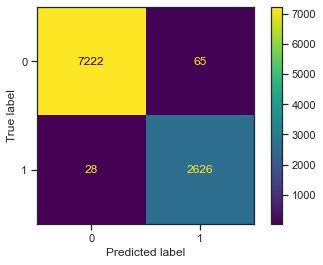

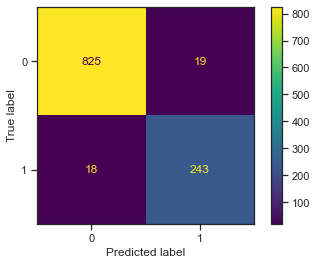

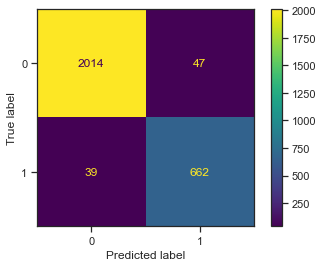

In [40]:
evaluation_parametrics("Convolution Neural Network", y_train, yp_train, y_val, yp_val, y_test, yp_test)

In [41]:
print(history.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', '_timestamp', '_runtime'])


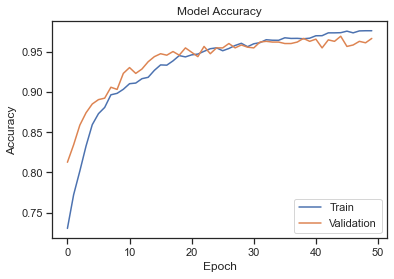

In [42]:
# Summarize History for Accuracy

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc = 'lower right')
plt.show()

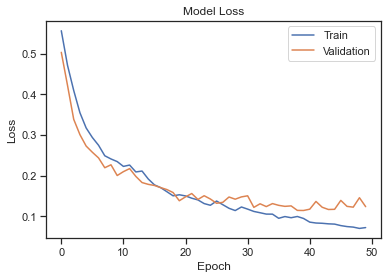

In [43]:
# Summarize History for Loss

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc = 'upper right')
plt.show()

In [44]:
model_builder = keras.applications.xception.Xception
img_size = (299, 299)
preprocess_input = keras.applications.xception.preprocess_input
decode_predictions = keras.applications.xception.decode_predictions
imag = []

last_conv_layer_name = "block14_sepconv2_act"

# Reading 2 Covid & 2 Normal Images for Grad-Cam Analysis

img_path = [path + "/COVID/COVID-1002.png",
            path + "/COVID/COVID-101.png",
            path + "/Normal/Normal-10004.png",
           path + "/Normal/Normal-10002.png"]

In [45]:
# To Get Image into numpy array

def get_img_array(img_path, size):
    img = keras.preprocessing.image.load_img(img_path, target_size = size) 
    array = keras.preprocessing.image.img_to_array(img) 
    array = np.expand_dims(array, axis = 0)
    return array

# Top create heatmaps for the samples

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index = None):
    grad_model = tf.keras.models.Model([model.inputs], [model.get_layer(last_conv_layer_name).output, model.output])

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [46]:
# Storing Heatmap values into list

covid_noncovid_heatmap = []

for i in img_path:
    img_array = preprocess_input(get_img_array(i, size = img_size))
    model = model_builder(weights = "imagenet")
    model.layers[-1].activation = None
    preds = model.predict(img_array)
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
    covid_noncovid_heatmap.append(heatmap)

In [47]:
# To Display GradCAM output for the samples

def save_and_display_gradcam(img_path, heatmap, cam_path = "cam.jpg", alpha = 0.4):
    img = keras.preprocessing.image.load_img(img_path)
    img = keras.preprocessing.image.img_to_array(img)

    heatmap = np.uint8(255 * heatmap)

    jet = cm.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)
    superimposed_img.save(cam_path)
    
    imag.append(cv2.imread(img_path))
    imag.append(cv2.imread("./cam.jpg"))


for i in range(len(img_path)):
    save_and_display_gradcam(img_path[i], covid_noncovid_heatmap[i])

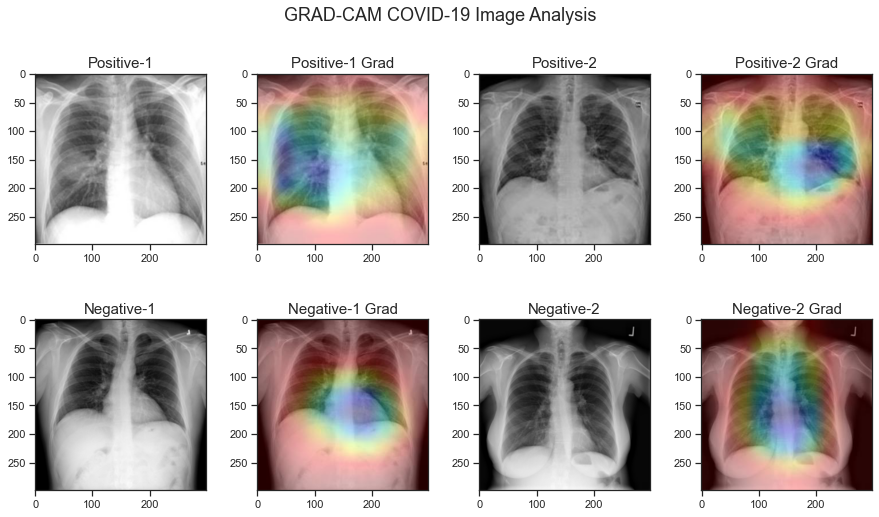

In [48]:
titles_list = ["Positive-1",'Positive-1 Grad','Positive-2','Positive-2 Grad','Negative-1','Negative-1 Grad','Negative-2','Negative-2 Grad']

plot_multiple_img(imag, titles_list, ncols = 4, main_title = "GRAD-CAM COVID-19 Image Analysis")

In [49]:
# Checking predictions for the above sample images

for i in img_path:
    z_img = cv2.imread(i)
    z_img = cv2.resize(z_img, (70, 70)) / 255.0
    z_img = z_img.reshape(1, z_img.shape[0], z_img.shape[1], z_img.shape[2])
    
    z = cnn_model.predict(z_img)
    z = np.argmax(z, axis = 1)
    print("Image", img_path.index(i) + 1, ":", z)

Image 1 : [1]
Image 2 : [1]
Image 3 : [0]
Image 4 : [0]


In [50]:
cnn_model.save('cnn_model.h5')

In [51]:
layer_names = [layer.name for layer in cnn_model.layers]
layer_names

['conv2d',
 'max_pooling2d',
 'dropout',
 'conv2d_1',
 'max_pooling2d_1',
 'dropout_1',
 'conv2d_2',
 'max_pooling2d_2',
 'flatten',
 'dense',
 'dropout_2',
 'dense_1']

In [52]:
cnn_model.layers

In [53]:
os.getcwd()

'C:\\Users\\mbgdw\\ML_project'

(1, 70, 70, 3)


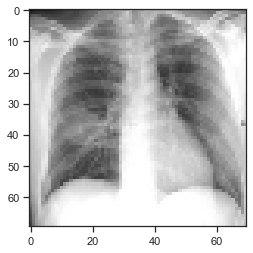

In [54]:
from keras.preprocessing import image
import numpy as np

# Pre-processing the image
image_path = path + "/COVID/COVID-1002.png"
img = image.load_img(image_path, target_size = (70, 70))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis = 0)
img_tensor = img_tensor / 255.
  
# Print image tensor shape
print(img_tensor.shape)
  
# Print image
import matplotlib.pyplot as plt
plt.imshow(img_tensor[0])
plt.show()

(1, 68, 68, 128)


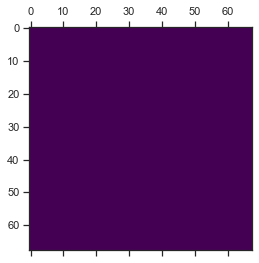

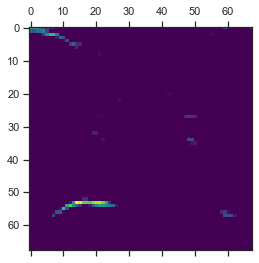

In [55]:
# Outputs of the 8 layers, which include conv2D and max pooling layers
layer_outputs = [layer.output for layer in cnn_model.layers[:8]]
activation_model = models.Model(inputs = cnn_model.input, outputs = layer_outputs)
activations = activation_model.predict(img_tensor)
  
# Getting Activations of first layer
first_layer_activation = activations[0]
  
# shape of first layer activation
print(first_layer_activation.shape)
  
# # 6th channel of the image after first layer of convolution is applied
# plt.matshow(first_layer_activation[0, :, :, 2], cmap ='viridis')
  
# # 15th channel of the image after first layer of convolution is applied
# plt.matshow(first_layer_activation[0, :, :, 8], cmap ='viridis')

# 6th channel of the image after first layer of convolution is applied
plt.matshow(first_layer_activation[0, :, :, 6], cmap ='viridis')
  
# 15th channel of the image after first layer of convolution is applied
plt.matshow(first_layer_activation[0, :, :, 15], cmap ='viridis')

In [56]:
layer_names = []
  
for layer in cnn_model.layers[:8]:
  layer_names.append(layer.name)
print(layer_names)

['conv2d', 'max_pooling2d', 'dropout', 'conv2d_1', 'max_pooling2d_1', 'dropout_1', 'conv2d_2', 'max_pooling2d_2']
